In [2]:
import pandas as pd
import glob
import matplotlib.pyplot as plt
import os
from ripple_heterogeneity.utils import functions,loading
import seaborn as sns
from tqdm import tqdm

C:\Users\Cornell\anaconda3\envs\ripple_diversity\lib\site-packages\nelpy\plotting\decoding.py:9: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.


# List of animals to use 

In [3]:
animal = ['GirardeauG\Rat08','GirardeauG\Rat09','GirardeauG\Rat10','GirardeauG\Rat11',
    'AB1','AB3','AB4','AYA4','AYA6','AYA7','AYA9','AYA10',
    'OML5','OML3','OML7','OML8','OML10','OML18','OML19',
    'Wmaze2\OR15','Wmaze2\OR18','Wmaze3\OR22','Wmaze3\OR21','Wmaze3\OR23',
    'GrosmarkAD\Cicero','GrosmarkAD\Buddy','GrosmarkAD\Achilles','GrosmarkAD\Gatsby',
    'Kenji']
# animal = ['GirardeauG\Rat11']

dataDir1 = 'A:/Data/'
dataDir2 = 'A:/OptoMECLEC/'
dataDir3 = 'A:/ORproject/'

# Load in data from cell_metrics

In [7]:
df = pd.DataFrame()
for a in tqdm(animal):
    # print(a)

    if 'OML' in a:
        base_path = dataDir2
    elif 'Wmaze' in a:
        base_path = dataDir3
    else:
        base_path = dataDir1

    files = glob.glob(base_path+a+'/**/*.cell_metrics.cellinfo.mat',recursive=True)

    for f in files:
        # print(f)
        basepath, _ = os.path.split(f)
        basepath = os.path.normpath(basepath)
        basename = os.path.basename(basepath)
        if (
            os.path.exists(os.path.join(basepath,basename+'.cell_metrics.cellinfo.mat')) &
                os.path.exists(os.path.join(basepath,basename+'.SWRunitMetrics.mat'))
           ):
            # get cell_metrics
            df1,_ = loading.load_cell_metrics(basepath)

            # get SWRunitMetrics 
            df2 = loading.load_SWRunitMetrics(basepath)
            for _ in range(df2.epoch.nunique()-1):
                df1 = df1.append(df1,ignore_index=True)

            df_ = pd.concat([df1,df2], axis=1)

            df = df.append(df_,ignore_index=True)

100%|██████████| 29/29 [04:39<00:00,  9.65s/it]


In [8]:
# lower case brain region and putativeCellType
df.brainRegion = df.brainRegion.str.lower()
df.putativeCellType = df.putativeCellType.str.lower()

# right and left ca1 just to ca1
df.loc[(df.brainRegion=="lca1") | (df.brainRegion=="rca1"),'brainRegion'] = "ca1"

# remove columns that are >50% nan
# nan_count = df.isna().sum()
# idx = nan_count.values > df.shape[0]*.5 
# df.drop(columns=df.keys()[idx])

# add ca1 layer
df['ca1_layer'] = "unknown"
df.loc[df.CA1depth > 0,'ca1_layer'] = "deep"
df.loc[df.CA1depth == 0,'ca1_layer'] = "mid"
df.loc[df.CA1depth < 0,'ca1_layer'] = "sup"

# save df
df.to_csv(r'D:\projects\ripple_heterogeneity\swr_pipe_all.csv')
df

,UID,ab_ratio,acg_asymptote,acg_c,acg_d,acg_fit_rsquare,acg_h,acg_refrac,acg_tau_burst,acg_tau_decay,...,cv2_WAKEnontheta,cv2_WAKEtheta,firingRateISI_WAKEnontheta,firingRateISI_WAKEtheta,firingRate_WAKEnontheta,firingRate_WAKEtheta,nCellsEvent,nSpkEvent,FRevent,ca1_layer
0,1,-0.136604,7.429647,22.681721,1.815132,0.960209,4.357981,3.996647,0.805989,21.241162,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown
1,2,-0.277361,2.734427,15.400654,1.243590,0.972238,23.657980,4.702613,0.566704,11.089766,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown
2,3,0.140434,1.205129,1.217749,6.105130,0.324401,2.982449,0.000620,4.225259,27.169088,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown
3,4,-0.247901,4.207843,50.872359,0.741409,0.979451,88.220260,4.800538,0.546334,8.686056,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown
4,5,-0.189986,1.503507,7.362391,3.220740,0.933306,28.048332,5.981751,1.026993,11.403929,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78312,45,-0.487316,2.908239,34.872689,1.477105,0.959025,22.021638,3.571092,0.716233,14.670906,...,1.128886,1.138913,7.908649,14.381268,0.140880,0.057811,NaN,NaN,NaN,unknown
78313,46,-0.539871,2.184381,10.943341,4.717377,0.764280,11.170513,1.418454,1.874889,11.942820,...,0.910165,0.941663,5.393422,4.662274,0.474666,0.162208,NaN,NaN,NaN,unknown
78314,47,-0.797156,1.964000,51.411917,1.128616,0.322295,4.875674,5.747494,3.606801,5.961174,...,1.007582,0.920910,1.313057,1.379848,0.093178,0.047355,NaN,NaN,NaN,unknown
78315,48,-0.511010,2.658000,19.373333,3.683894,0.753586,9.850144,2.703619,0.654042,9.463668,...,0.933940,1.013476,4.976609,3.894945,0.108008,0.027983,NaN,NaN,NaN,unknown


In [9]:
print(len(df.animal.unique()),' animals')
# print(df[df.epoch=='task'].animal.value_counts())
print(df.animal.unique())

print('')
df['animal_session'] = df.animal+df.basename
print(len(df.animal_session.unique()),' individual sessions')
# print(df.animal_session.unique())

print('')
print(sum(df.epoch == "task"),' units during some type of task')

print('')
print(df[df.epoch=='task'].putativeCellType.value_counts())

# print('')
# print(df[df.epoch=='task'].task.value_counts())

print('')
print(df[df.epoch=='task'].brainRegion.value_counts())

print('')
print(df[df.epoch=='task'].ca1_layer.value_counts())

print('')
print(df.epoch.value_counts())

38  animals
['Rat08' 'Rat09' 'Rat10' 'Rat11' 'AB1' 'AB3' 'AB4' 'AYA4' 'AYA6' 'AYA7'
 'AYA9' 'AYA10' 'OML5' 'OML3' 'OML7' 'OML8' 'OML10' 'OML18' 'OML19' 'OR15'
 'OR18' 'OR22' 'OR21' 'OR23' 'Cicero' 'Buddy' 'Achilles' 'Gatsby' 'Kenji'
 'ec013' 'ec014' 'ec016' 'f01_m' 'g01_m' 'i01_m' 'j01_m' 'km01' 'nlx']

266  individual sessions

25957  units during some type of task

pyramidal cell        20625
narrow interneuron     3651
wide interneuron       1681
Name: putativeCellType, dtype: int64

ca1        10327
cpu         3025
ca3         2211
blv         1665
bmp         1348
dg           920
ca2          786
ec3          724
mec          688
ec4          660
ven          639
ec2          635
den          446
plc01        368
ec5          343
ladl         309
dgca3        215
ca3dg        177
unknown      136
ca            90
pir           84
pfc           77
ncx           31
ec1           22
ctx            3
Name: brainRegion, dtype: int64

unknown    18098
sup         4491
deep        2423

In [12]:
df = pd.read_csv(r'D:\projects\ripple_heterogeneity\swr_pipe_all.csv')


C:\Users\Cornell\anaconda3\envs\ripple_diversity\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (87,99,119) have mixed types.Specify dtype option on import or set low_memory=False.


In [23]:
df.animal.unique()

array(['Rat08', 'Rat09', 'Rat10', 'Rat11', 'AB1', 'AB3', 'AB4', 'AYA4',
       'AYA6', 'AYA7', 'AYA9', 'AYA10', 'OML5', 'OML3', 'OML7', 'OML8',
       'OML10', 'OML18', 'OML19', 'OR15', 'OR18', 'OR22', 'OR21', 'OR23',
       'Cicero', 'Buddy', 'Achilles', 'Gatsby', 'Kenji', 'ec013', 'ec014',
       'ec016', 'f01_m', 'g01_m', 'i01_m', 'j01_m', 'km01', 'nlx'],
      dtype=object)

(0.0, 1.0)

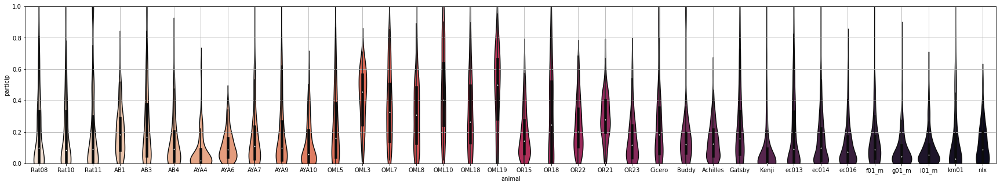

In [11]:

# g = sns.catplot(x="animal", y="particip",
#                 data=df[(df.putativeCellType=="pyramidal cell") & (df.brainRegion=="ca1") & (df.epoch=="task")], kind="strip",
#                 height=3, aspect=7,palette="rocket_r")
# plt.grid()                 
# g = sns.catplot(x="animal", y="particip",
#                 capsize=.2, palette="rocket_r", height=3, aspect=7,
#                 kind="point", data=df[(df.putativeCellType=="pyramidal cell") & (df.brainRegion=="ca1") & (df.epoch=="task")])
# g.despine(left=True)
# plt.grid()
plt.figure(figsize=(30,5))

g = sns.violinplot(x="animal",
                    y="particip",
                    data=df[(df.putativeCellType=="pyramidal cell") & (df.brainRegion=="ca1") & (df.epoch=="task")],
                    palette="rocket_r")
plt.grid('on')
plt.ylim(0,1)

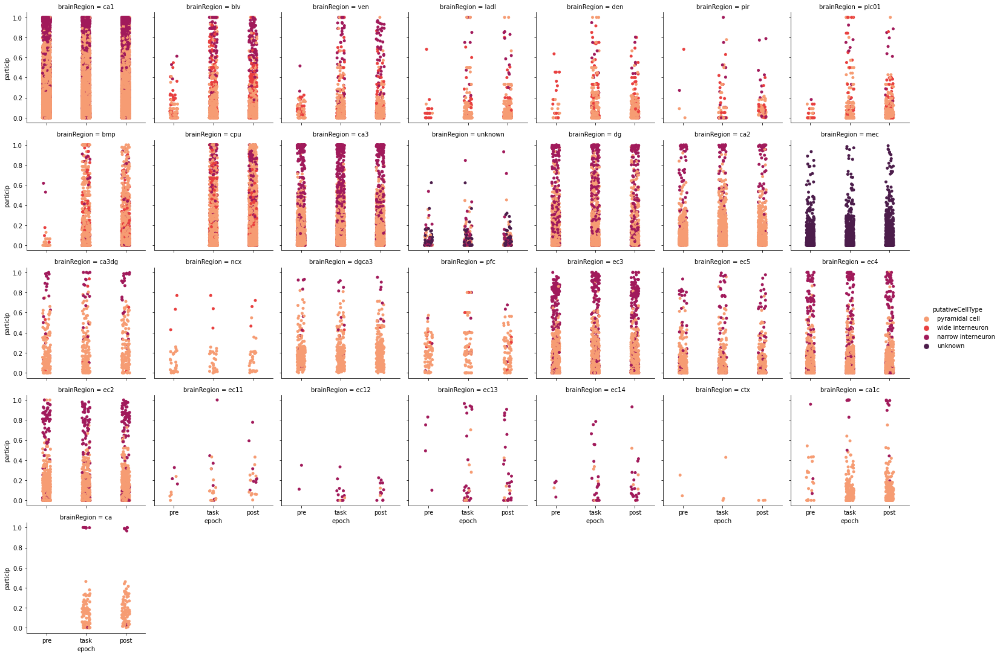

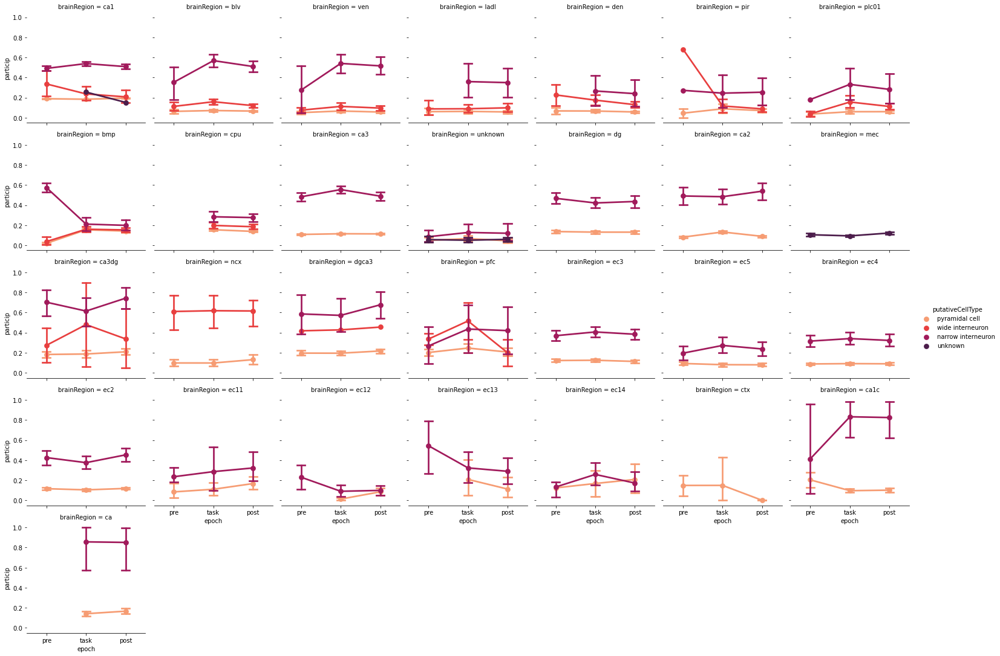

In [41]:
g = sns.catplot(x="epoch", y="particip",
                hue="putativeCellType", col="brainRegion",col_wrap=7,
                data=df, kind="strip",
                 height=3, aspect=1,palette="rocket_r")
                 
g = sns.catplot(x="epoch", y="particip", hue="putativeCellType",col='brainRegion',col_wrap=7,
                capsize=.2, palette="rocket_r", height=3, aspect=1,
                kind="point", data=df)
g.despine(left=True)

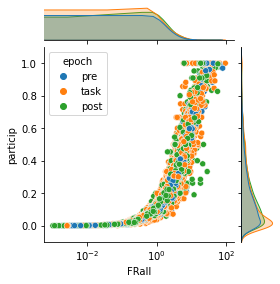

In [46]:
g = sns.jointplot(x="FRall",
                    y="particip",
                    hue="epoch",
                    data=df[(df.putativeCellType=="pyramidal cell") & (df.brainRegion=="ca1")],
                    ylim=(-0.1, 1.1),
                    height=4,
                    alpha=1)
ax = g.ax_joint
ax.set_xscale('log')

# g.ax_marg_x.set_xscale('log')

# comparison of participation across ca1 layers over epochs

(0.0, 0.3)

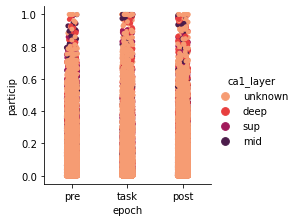

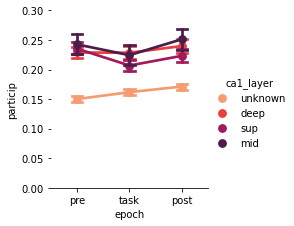

In [35]:
g = sns.catplot(x="epoch", y="particip",
                hue="ca1_layer",
                data=df[(df.putativeCellType=="pyramidal cell") & (df.brainRegion=="ca1")], kind="strip",
                height=3, aspect=1,palette="rocket_r")
                  
g = sns.catplot(x="epoch", y="particip", hue="ca1_layer",
                capsize=.2, palette="rocket_r", height=3, aspect=1,
                kind="point", data=df[(df.putativeCellType=="pyramidal cell") & (df.brainRegion=="ca1")])
g.despine(left=True)
plt.ylim(0,.3)

(0.0, 0.3)

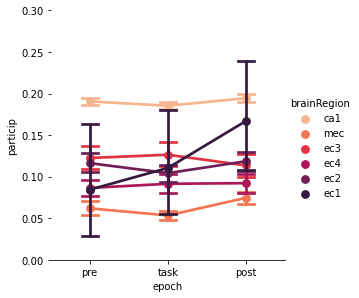

In [28]:
ec_idx = (df.brainRegion == 'ec1') | (df.brainRegion == 'ec2') | (df.brainRegion == 'ec3') | (df.brainRegion == 'ec4') | (df.brainRegion == 'mec') 
ca1_idx = (df.brainRegion == 'ca1')

g = sns.catplot(x="epoch", y="particip", hue="brainRegion",
                capsize=.2, palette="rocket_r", height=4, aspect=1,
                kind="point", 
                data=df[(df.putativeCellType=="pyramidal cell") & (ec_idx | ca1_idx)])
g.despine(left=True)
plt.ylim(0,.3)

In [39]:
# print(df.brainRegion.unique())
# sum(df.brainRegion == 'unknown')

# sum(df.CA1depth  == np.nan)

sum((df.brainRegion=='ca1') & (df.ca1_layer == 'unknown'))

sum((df.brainRegion=='ca1'))

34606